# Snowmelt timing with Sentinel-1 SAR at Grand Mesa, CO

#### Applying my [SAR snowmelt timing toolbox](https://github.com/egagli/sar_snow_melt_timing) to Grand Mesa, CO for snowex hackweek. Snowex hackweek repo can be found [here](https://github.com/snowex-hackweek/snowmelt-timing) and presentation can be found [here](https://docs.google.com/presentation/d/1D-t0BT5zrmGV-8o6O4DEFhmdDeUwdOxDfkmsYYA0vOg/edit#slide=id.g13d0e1ed0eb_4_14).

#### Our timeframe of interest is December 1st 2019 - August 1st 2020.

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
import ulmo
from datetime import datetime
import sys
import contextily as ctx
import rioxarray as rxr
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib
import matplotlib.transforms as mtransforms
import logging
import geopandas as gpd
import requests
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils

In [2]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [3]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 
#
xr.set_options(keep_attrs=True)
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False,silence_logs=logging.ERROR)
client

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 46411 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:46411/status,
Dashboard: http://172.25.45.79:46411/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/400970/1,Workers: 1
Dashboard: http://172.25.45.79:46411/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/400970/4,Total threads: 32
Dashboard: http://172.25.45.79:34167/status,Memory: 125.71 GiB
Nanny: None,


## Let's set the location via geojson obtained from geojson.io.

In [4]:
grandmesa_bbox_gdf = gpd.read_file('../input/shapefiles/grandmesa.geojson')

In [5]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(grandmesa_bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection='../input/sentinel1-rtc-aws/mycollection_grandmesa.json')
ts_ds = ts_ds.compute()
ts_ds = ts_ds.dropna('time',how='all')

## Let's check out the xarray dataset.

In [6]:
ts_ds

<xarray.DataArray 'stackstac-adc0ae33b460c580b651d0ee8d9a519f' (time: 139, y: 1278, x: 1524)>
array([[[0.06743611, 0.06719408, 0.08140442, ..., 0.13940993,
         0.14946932, 0.15956731],
        [0.0789023 , 0.07852138, 0.08137354, ..., 0.1291121 ,
         0.13201442, 0.13903536],
        [0.09401289, 0.08817654, 0.08261676, ..., 0.11946211,
         0.12119088, 0.12709263],
        ...,
        [0.08825005, 0.08951563, 0.07989465, ..., 0.28963238,
         0.19918354, 0.21632132],
        [0.09546206, 0.09385803, 0.08523879, ..., 0.3344276 ,
         0.09648466, 0.07496416],
        [0.09492607, 0.09493371, 0.07615872, ..., 0.1622464 ,
         0.05657446, 0.04626776]],

       [[0.03146842, 0.03306774, 0.03446444, ..., 0.18271056,
         0.18757407, 0.20819831],
        [0.03893813, 0.03703857, 0.03220706, ..., 0.16343096,
         0.15829931, 0.17174731],
        [0.05666439, 0.05778628, 0.04237801, ..., 0.14855771,
         0.1496809 , 0.1658141 ],
...
        [0.08214173, 0.07935501, 0.08434574, ..., 0.8771973 ,
         0.3238292 , 0.06575929],
        [0.08634055, 0.09068741, 0.11160585, ..., 2.035367  ,
         0.8765693 , 0.10349693],
        [0.09113108, 0.09772265, 0.11805467, ..., 0.7707731 ,
         0.32397103, 0.0859975 ]],

       [[0.04683863, 0.04885991, 0.05108799, ..., 0.13007738,
         0.13922408, 0.14551173],
        [0.04664215, 0.04945912, 0.05099176, ..., 0.10845059,
         0.11372601, 0.12036335],
        [0.0496573 , 0.05504532, 0.05546185, ..., 0.09796564,
         0.10189676, 0.11016722],
        ...,
        [0.07004756, 0.07060084, 0.06651849, ..., 0.34989062,
         0.30707753, 0.5093004 ],
        [0.0732572 , 0.06911237, 0.05933972, ..., 0.57340133,
         0.1611114 , 0.3821751 ],
        [0.07266677, 0.0673086 , 0.05583687, ..., 0.1204522 ,
         0.07479714, 0.08302547]]], dtype=float32)
Coordinates:
  * time                         (time) datetime64[ns] 2016-11-21T01:09:37 .....
    id                           (time) <U22 'S1B_20161121_13SBD_ASC' ... 'S1...
    band                         <U9 'gamma0_vv'
  * x                            (x) float64 2.123e+05 2.123e+05 ... 2.427e+05
  * y                            (y) float64 4.333e+06 4.333e+06 ... 4.307e+06
    sar:pixel_spacing_azimuth    int64 10
    sar:center_frequency         float64 5.405
    mgrs:latitude_band           <U1 'S'
    sar:looks_range              int64 5
    sar:looks_azimuth            int64 1
    sar:resolution_azimuth       float64 22.6
    sar:instrument_mode          <U2 'IW'
    mgrs:utm_zone                <U2 '13'
    sentinel:product_ids         (time) object ['S1B_IW_GRDH_1SDV_20161121T01...
    sat:orbit_state              (time) <U10 'ascending' ... 'ascending'
    proj:epsg                    int64 32613
    mgrs:grid_square             <U2 'BD'
    platform                     (time) <U11 'sentinel-1b' ... 'sentinel-1b'
    constellation                <U10 'sentinel-1'
    created                      (time) <U27 '2022-06-30T20:46:33.822950Z' .....
    proj:transform               object {0.0, 1.0, 4400040.0, -20.0, 199980.0...
    sar:product_type             <U3 'RTC'
    sar:pixel_spacing_range      int64 10
    sentinel:mgrs                <U5 '13SBD'
    start_datetime               (time) <U20 '2016-11-21T01:09:10Z' ... '2021...
    sat:relative_orbit           (time) int64 49 49 49 49 49 ... 129 49 129 49
    sar:frequency_band           <U1 'C'
    sat:absolute_orbit           (time) int64 3050 3750 4100 ... 37476 26500
    end_datetime                 (time) <U20 '2016-11-21T01:10:04Z' ... '2021...
    gsd                          int64 20
    sar:polarizations            object {'VV', 'VH'}
    instruments                  <U5 'c-sar'
    sar:looks_equivalent_number  float64 4.3
    proj:shape                   object {5490}
    sar:observation_direction    <U5 'right'
    sar:resolution_range         float64 20.3
    title                        <U21 'Gamma0 VV backscatter

## Let's see the timings of the Sentinel-1 acquisitions.

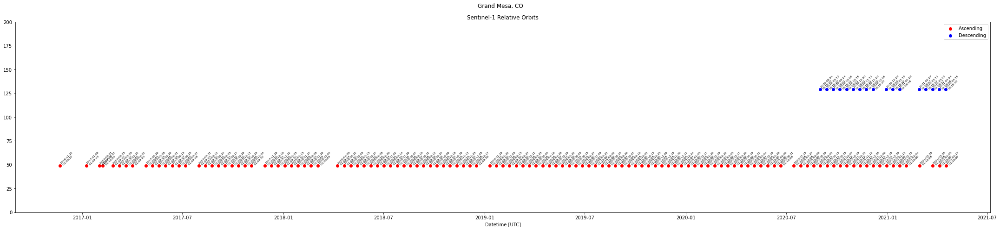

In [7]:
f,ax=plt.subplots(figsize=(30,7))
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax,textsize=6)
f.suptitle(f'Grand Mesa, CO')
plt.tight_layout()

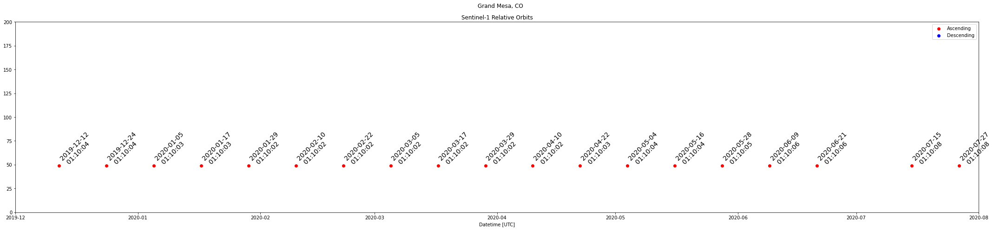

In [8]:
f,ax=plt.subplots(figsize=(30,7))
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax,start_date='2019-12-01',end_date='2020-08-01',textsize=14)
f.suptitle(f'Grand Mesa, CO')
plt.tight_layout()

### Looks like 6pm as expected, sweet.

## Let's clip to the melt season.

In [9]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(grandmesa_bbox_gdf,start_time='2019-12-01',end_time='2020-08-01',orbit_direction='all',polarization='gamma0_vv',collection='../input/sentinel1-rtc-aws/mycollection_grandmesa.json')
ts_ds = ts_ds.compute()
ts_ds = ts_ds.dropna('time',how='all')

## Let's take a preliminary look at RGB and NDSI data from Sentinel-2 throughout the melt season.

In [10]:
rgb = s1_rtc_bs_utils.get_s2_rgb(ts_ds)
ndsi = s1_rtc_bs_utils.get_s2_ndsi(ts_ds)
#ndwi = s1_rtc_bs_utils.get_s2_ndwi(ts_ds)
new_rgb = np.clip(rgb/np.amax(rgb),0,1)

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/xarray/core/indexing.py:1227: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


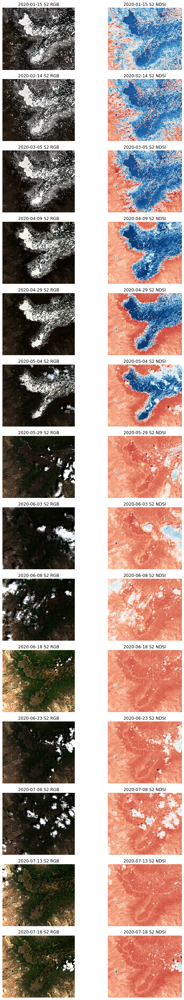

In [11]:
f,ax=plt.subplots(min(len(ndsi.time),len(rgb.time)),2,figsize=(10,40))

for i in range(min(len(ndsi.time),len(rgb.time))):
    new_rgb.isel(time=i).plot.imshow(ax=ax[i,0],rgb='band',robust=True)
    ndsi.isel(time=i).plot.imshow(ax=ax[i,1],add_colorbar=False,cmap='RdBu',vmin=-1,vmax=1)
    #ndwi.isel(time=i).plot.imshow(ax=ax[i,2],add_colorbar=False,vmin=-1,vmax=1)

    ax[i,0].set_aspect('equal')
    ax[i,1].set_aspect('equal')
    #ax[i,2].set_aspect('equal')

    ax[i,0].axis('off')
    ax[i,1].axis('off')
    #ax[i,2].axis('off')

    
    ax[i,0].set_title(f'{pd.to_datetime(rgb.time.values[i]).strftime("%Y-%m-%d")} S2 RGB')
    ax[i,1].set_title(f'{pd.to_datetime(rgb.time.values[i]).strftime("%Y-%m-%d")} S2 NDSI')
    #ax[i,2].set_title(f'{pd.to_datetime(rgb.time.values[i]).strftime("%Y-%m-%d")} S2 NDWI')


    
plt.tight_layout()

## Let's take a peak at the SAR scenes.

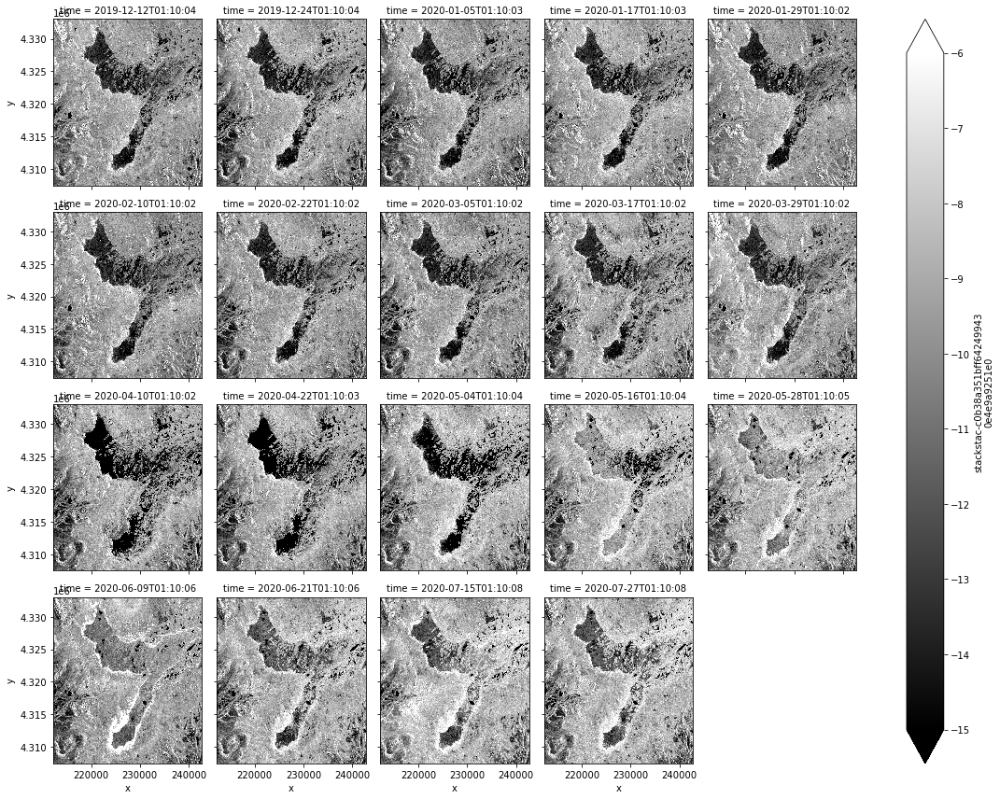

In [12]:
ts_ds_db = 10.0*np.log10(ts_ds)
ts_ds_db.plot(col='time',col_wrap=5,robust=False,cmap='gray',vmin=-15,vmax=-6)

## Let's check the SWE measurements at nearby SNOTEL sites.

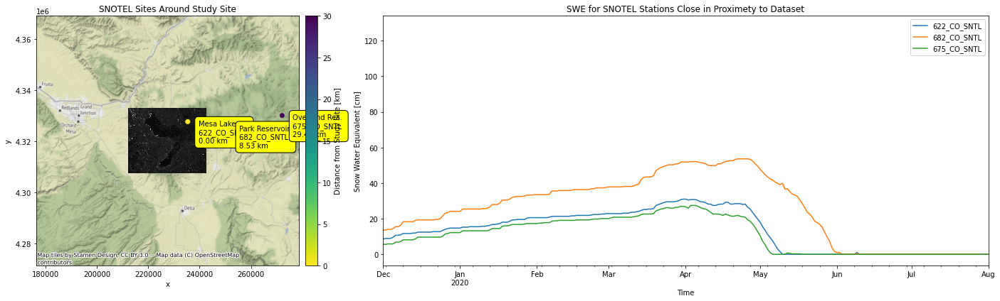

In [13]:
f,ax=plt.subplots(1,2,figsize=(20,6),gridspec_kw={'width_ratios': [1, 2]})

s1_rtc_bs_utils.plot_closest_snotel(ts_ds,distance_cutoff=30,ax=ax[0])

snotel_data = s1_rtc_bs_utils.get_closest_snotel_data(ts_ds,variable_code='SNOTEL:WTEQ_D',distance_cutoff=30,start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
snotel_data_cm = snotel_data*2.54
snotel_data_cm.plot(ax=ax[1])

ax[1].set_xlabel('Time')
ax[1].set_ylabel('Snow Water Equivalent [cm]')
ax[1].set_title('SWE for SNOTEL Stations Close in Proximety to Dataset')
ax[1].set_xlim(['2019-12-01','2020-08-01'])

plt.tight_layout()

## Let's try out a plot that combines S1 backscatter, S2 NDSI, and the nearest SNOTEL station.

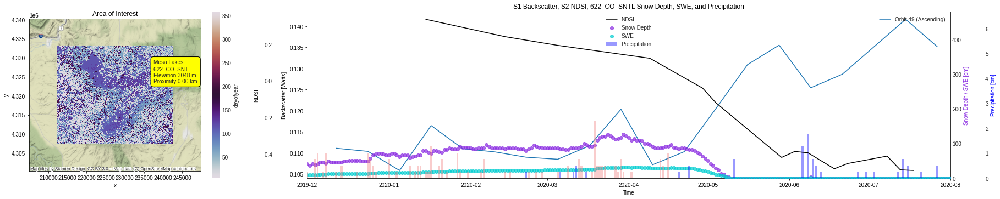

In [14]:
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(ts_ds,start_date='2019-12-01',end_date='2020-08-01')

## Looks like we need to do some masking. Let's first try masking by NDVI.

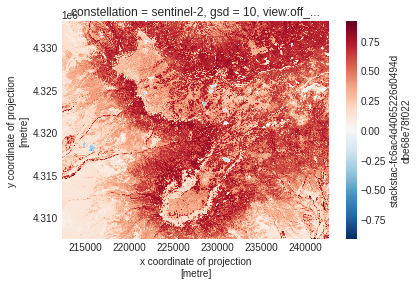

In [15]:
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)

f,ax=plt.subplots()
summer_ndvi_ds.plot(ax=ax)

## Masking by NDVI might be a bit too noisy here. Maybe let's just mask by an elevation height. Let's test a couple thresholds:

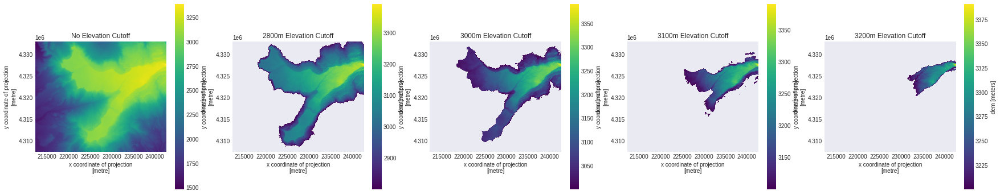

In [16]:
dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)

f,ax=plt.subplots(1,5,figsize=(30,6))
dem.plot(ax=ax[0])
dem.where(dem>2800).plot(ax=ax[1])
dem.where(dem>3000).plot(ax=ax[2])
dem.where(dem>3100).plot(ax=ax[3])
dem.where(dem>3200).plot(ax=ax[4])
ax[0].set_title('No Elevation Cutoff')
ax[1].set_title('2800m Elevation Cutoff')
ax[2].set_title('3000m Elevation Cutoff')
ax[3].set_title('3100m Elevation Cutoff')
ax[4].set_title('3200m Elevation Cutoff')

for axs in ax:
    axs.set_aspect('equal')

## 3000m looks like a good cutoff. Let's rerun our analysis with this elevation mask.

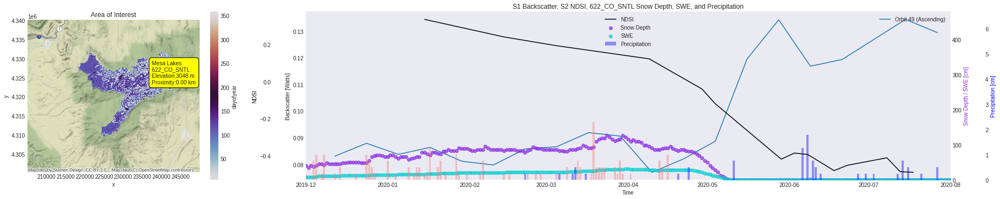

In [17]:
ts_ds_dem_masked = ts_ds.where(dem>3000)
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(ts_ds_dem_masked,start_date='2019-12-01',end_date='2020-08-01')

## Great! Now let's pull in the snowpit location and swe data. (Thank you Megan Mason!)

In [18]:
url = "https://gist.githubusercontent.com/meganmason/dde13c46a90875e364b1c25a31bff1d8/raw/d361e1a56eeb867bd89c87b4dc13ed431ffff6f6/SNEX_TS_SP_avg_prelim_Hackweek.geojson"
snowpits = gpd.read_file(url)

In [19]:
# keep columns we want in the dataframe
url = "https://gist.githubusercontent.com/meganmason/40a87840b52c5516efc716236a67ccf3/raw/9767072779ac6f22d13e5e4dbf2c7e85f3e6e15e/SNEX20_TS_SP_cogm_swe.geojson"
swe = gpd.read_file(url)
trunc = lambda x: x[:6]
swe.PitID = swe.PitID.apply(trunc)
swe = swe[['PitID','Site', 'Date/Local Standard Time', 'SWE (mm)']]
swe = swe.rename({'Date/Local Standard Time': 'date', 'SWE (mm)': 'swe (mm)'}, axis=1)
swe.date = pd.to_datetime(swe.date)

## Let's select all of the Grand Mesa sites and reproject to UTM.

In [20]:
snowpits = snowpits[snowpits['Location']=='Grand Mesa']
snowpits = snowpits.to_crs(ts_ds.rio.crs)

In [21]:
snowpits

,State,Location,Site,PitID,Latitude,Longitude,Pit Count,Snow Class,geometry
24,CO,Grand Mesa,County Line Open,COGMCO,39.03053,-108.03220,12,2,POINT (237523.755 4324540.547)
25,CO,Grand Mesa,County Line Tree,COGMCT,39.03223,-108.03438,10,2,POINT (237341.310 4324735.553)
26,CO,Grand Mesa,Mesa West Open,COGMWO,39.03399,-108.21390,10,2,POINT (221805.501 4325465.175)
27,CO,Grand Mesa,Mesa West Trees,COGMWT,39.03282,-108.21291,7,2,POINT (221886.622 4325332.264)
28,CO,Grand Mesa,Skyway Open,COGMSO,39.04511,-108.06209,21,2,POINT (234990.406 4326245.751)
29,CO,Grand Mesa,Skyway Tree,COGMST,39.04565,-108.06333,18,2,POINT (234885.089 4326309.311)


## Now let's plot our snowpit sites on top of our estimated DOY runoff onset Map.

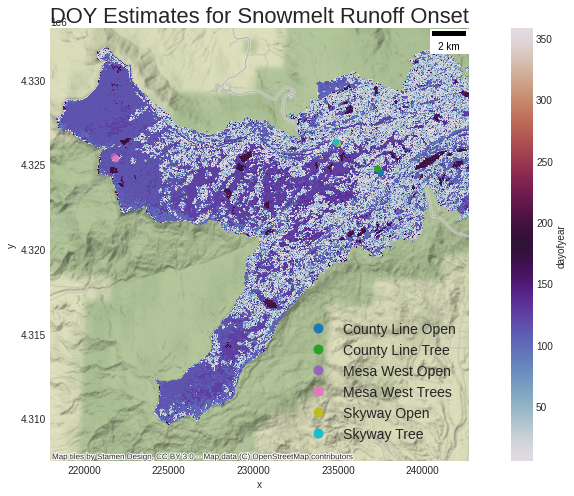

In [22]:
f,ax=plt.subplots(figsize=(12,7))
runoff_map = s1_rtc_bs_utils.get_runoff_onset(ts_ds_dem_masked).dt.dayofyear
runoff_map.plot(ax=ax,cmap='twilight')
snowpits.plot(ax=ax,categorical=True,column='Site',legend=True,legend_kwds={'bbox_to_anchor':(1.0, .35),'fontsize':14,'frameon':False})
ctx.add_basemap(ax=ax, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
ax.set_title('DOY Estimates for Snowmelt Runoff Onset',fontsize=22)
ax.set_xlim(left=218000)
ax.set_aspect('equal')
ax.add_artist(ScaleBar(1.0))
plt.tight_layout()

plt.savefig('../output/grandmesa/plots/runoff_map.png')

## Let's zoom in a bit more.

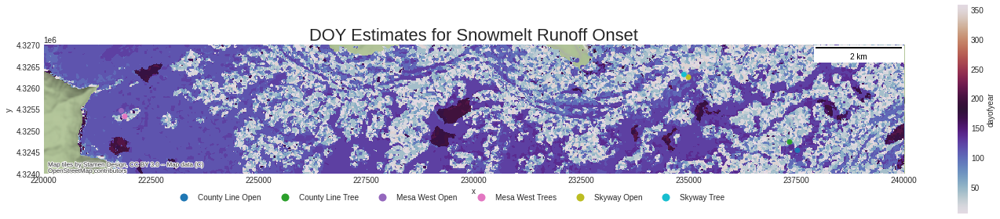

In [23]:
f,ax=plt.subplots(figsize=(20,4))
runoff_map.plot(ax=ax,cmap='twilight')
snowpits.plot(ax=ax,categorical=True,column='Site',legend=True,legend_kwds={'bbox_to_anchor':(0.8, -0.1),'fontsize':10,'frameon':False,'ncol':6})
ctx.add_basemap(ax=ax, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
ax.set_title('DOY Estimates for Snowmelt Runoff Onset',fontsize=22)
ax.set_xlim([220000,240000])
ax.set_ylim([4.324E6,4.327E6])
ax.add_artist(ScaleBar(1.0))

plt.tight_layout()

plt.savefig('../output/grandmesa/plots/runoff_map_zoomed.png')

## Let's check out the runoff estimates around the snowpits. Let's use a 100m buffer.

In [24]:
snowpits_buffer = snowpits.copy()
snowpits_buffer['geometry'] = snowpits_buffer.geometry.buffer(100)

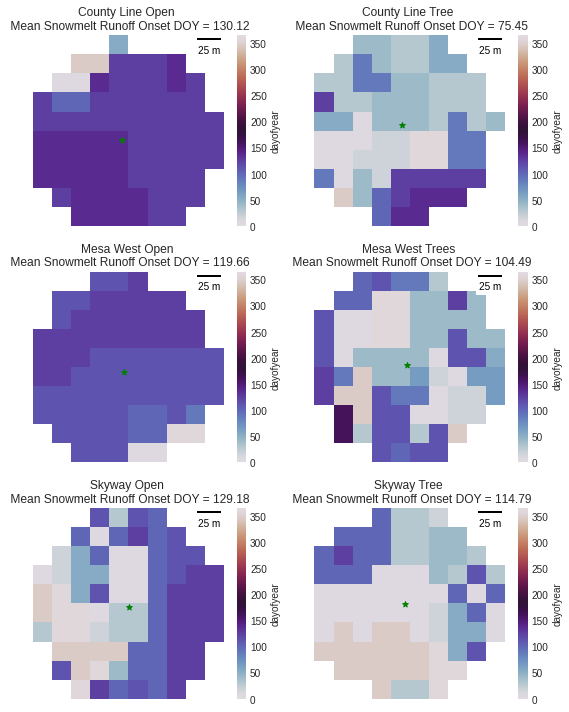

In [25]:
PitIDs = ['COGMCO','COGMCT','COGMWO','COGMWT','COGMSO','COGMST']

f,ax=plt.subplots(3,2,figsize=(8,10))

for pitid, axs in zip(PitIDs,ax.ravel()):
    snowpit = snowpits_buffer[snowpits_buffer['PitID']==pitid]
    runoff_map_clipped = runoff_map.rio.clip(snowpit.geometry)
    runoff_map_clipped.plot(ax=axs,cmap='twilight',vmin=0,vmax=365)
    #ctx.add_basemap(ax=axs, crs=runoff_map_clipped.rio.crs, source=ctx.providers.Stamen.Terrain)

    snowpits[snowpits['PitID']==pitid].plot(ax=axs,marker='*',color='green')

    axs.set_title(f'{snowpit.Site.values[0]} \n Mean Snowmelt Runoff Onset DOY = {runoff_map_clipped.mean().values:.2f}')
    axs.set_aspect('equal')
    axs.axis('off')
    
    axs.add_artist(ScaleBar(1.0))

plt.tight_layout()

plt.savefig('../output/grandmesa/plots/runoff_map_snowpits.png')

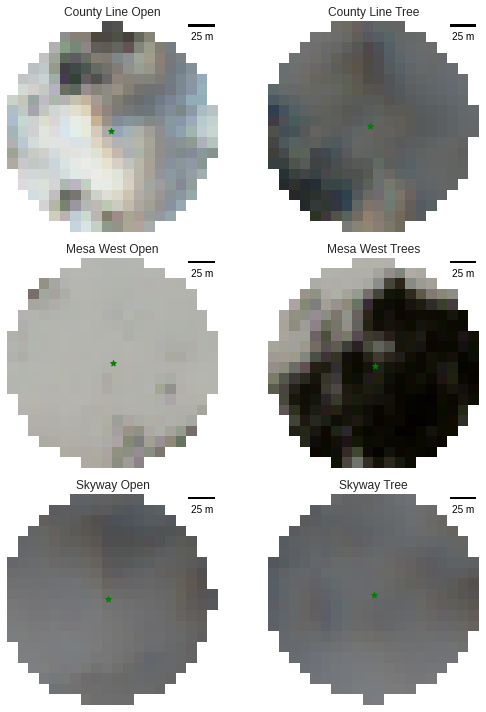

In [26]:
PitIDs = ['COGMCO','COGMCT','COGMWO','COGMWT','COGMSO','COGMST']

f,ax=plt.subplots(3,2,figsize=(8,10))

for pitid, axs in zip(PitIDs,ax.ravel()):
    snowpit = snowpits_buffer[snowpits_buffer['PitID']==pitid]
    runoff_map_clipped = new_rgb.isel(time=5).rio.clip(snowpit.geometry)
    runoff_map_clipped.plot.imshow(ax=axs,rgb='band',vmax=0.7)
    #ctx.add_basemap(ax=axs, crs=runoff_map_clipped.rio.crs, source=ctx.providers.Stamen.Terrain)

    snowpits[snowpits['PitID']==pitid].plot(ax=axs,marker='*',color='green')

    axs.set_title(f'{snowpit.Site.values[0]}')
    axs.set_aspect('equal')
    axs.axis('off')
    axs.add_artist(ScaleBar(1.0))

plt.tight_layout()

plt.savefig('../output/grandmesa/plots/runoff_map_snowpits_ndsi.png')

#### The open snowpit sites are a lot more spatially uniform in DOY estimates as expected. C-band radar will lose coherence in vegetated areas, so the backscatter minima at tree covered pixels will not necessarily be reflecting snowmelt properties. 

## And let's extract the backscatter timeseries over the buffered pixels for each site.

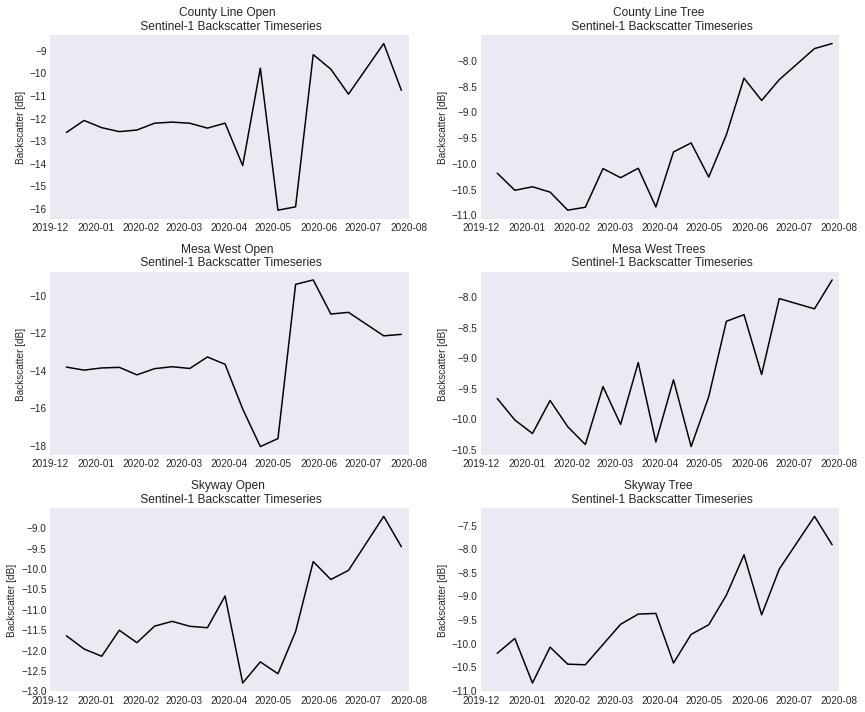

In [27]:
PitIDs = ['COGMCO','COGMCT','COGMWO','COGMWT','COGMSO','COGMST']

f,ax=plt.subplots(3,2,figsize=(12,10))

for pitid, axs in zip(PitIDs,ax.ravel()):
    snowpit = snowpits_buffer[snowpits_buffer['PitID']==pitid]
    ts_ds_clipped_site = ts_ds_dem_masked.rio.clip(snowpit.geometry)
    axs.plot(ts_ds_clipped_site.time,10*np.log10(ts_ds_clipped_site).mean(dim=['x','y']),color='black',label='Mean Backscatter [Watts]')
    start_date = '2019-12-01'
    end_date = '2020-08-01'
    axs.set_xlim([datetime.strptime(start_date,'%Y-%m-%d'),datetime.strptime(end_date,'%Y-%m-%d')])
    axs.set_ylabel('Backscatter [dB]')
    #runoff_map_clipped.plot(ax=axs,cmap='twilight',vmin=0,vmax=365)
    axs.set_title(f'{snowpit.Site.values[0]} \n Sentinel-1 Backscatter Timeseries')

    
    # to csv
    timeseries_time = ts_ds_clipped_site.time.values
    timeseries_values = 10*np.log10(ts_ds_clipped_site).mean(dim=['x','y']).values
    df = pd.DataFrame(timeseries_values,timeseries_time)
    df = df.reset_index()
    df.columns = ['datime','backcsatter_db']
    df.to_csv(f'../output/grandmesa/snowpit_backscatter_means_csv/{snowpit.Site.values[0]}.csv')
    
plt.tight_layout()

plt.savefig('../output/grandmesa/plots/bs_snowpits.png')

#### We can clearly see backscatter minima in the open sites.

## Let's add Sentinel-2 NSDI and NDWI.

In [28]:
ndsi_dem_masked = s1_rtc_bs_utils.get_s2_ndsi(ts_ds_dem_masked)
ndwi_dem_masked = s1_rtc_bs_utils.get_s2_ndwi(ts_ds_dem_masked)

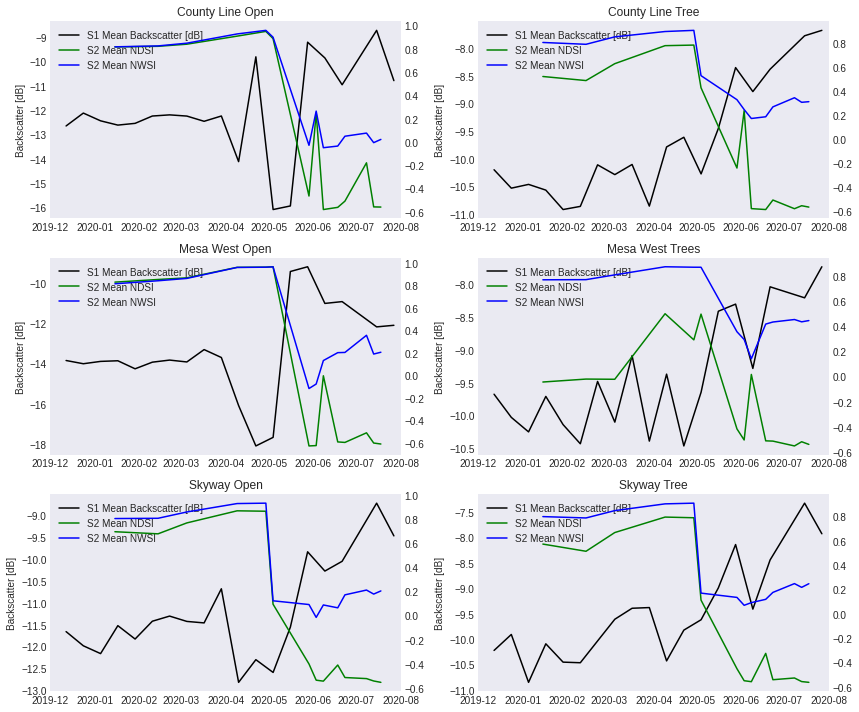

In [29]:
PitIDs = ['COGMCO','COGMCT','COGMWO','COGMWT','COGMSO','COGMST']

f,ax=plt.subplots(3,2,figsize=(12,10))

for pitid, axs in zip(PitIDs,ax.ravel()):
    snowpit = snowpits_buffer[snowpits_buffer['PitID']==pitid]
    ts_ds_clipped_site = ts_ds_dem_masked.rio.clip(snowpit.geometry)
    backscatter_line, = axs.plot(ts_ds_clipped_site.time,10*np.log10(ts_ds_clipped_site).mean(dim=['x','y']),color='black',label='S1 Mean Backscatter [dB]')
    start_date = '2019-12-01'
    end_date = '2020-08-01'
    axs.set_xlim([datetime.strptime(start_date,'%Y-%m-%d'),datetime.strptime(end_date,'%Y-%m-%d')])
    axs.set_ylabel('Backscatter [dB]')
    #runoff_map_clipped.plot(ax=axs,cmap='twilight',vmin=0,vmax=365)
    axs.set_title(f'{snowpit.Site.values[0]}')

    ndsi_ax = axs.twinx()
    ndsi_clipped_site = ndsi_dem_masked.rio.clip(snowpit.geometry)
    ndsi_clipped_site = ndsi_clipped_site.where(ndsi_clipped_site<1)
    ndsi_line, = ndsi_ax.plot(ndsi_clipped_site.time,ndsi_clipped_site.mean(dim=['x','y']),color='green',label='S2 Mean NDSI')
    
    
    ndwi_clipped_site = ndwi_dem_masked.rio.clip(snowpit.geometry)
    ndwi_clipped_site = ndwi_clipped_site.where(ndsi_clipped_site<1)
    ndwi_line, = ndsi_ax.plot(ndwi_clipped_site.time,ndwi_clipped_site.mean(dim=['x','y']),color='blue',label='S2 Mean NWSI')
    #ndsi_ax.set_ylim([0,1])
    
    axs.legend(handles=[backscatter_line,ndsi_line,ndwi_line])
plt.tight_layout()

plt.savefig('../output/grandmesa/plots/bs_snowpits_ndsi_ndwi.png')

#### Interesting interplay between NDSI and NDWI.

## Let's look at S1 Backscatter + S2 NDSI + Snowpit Data.

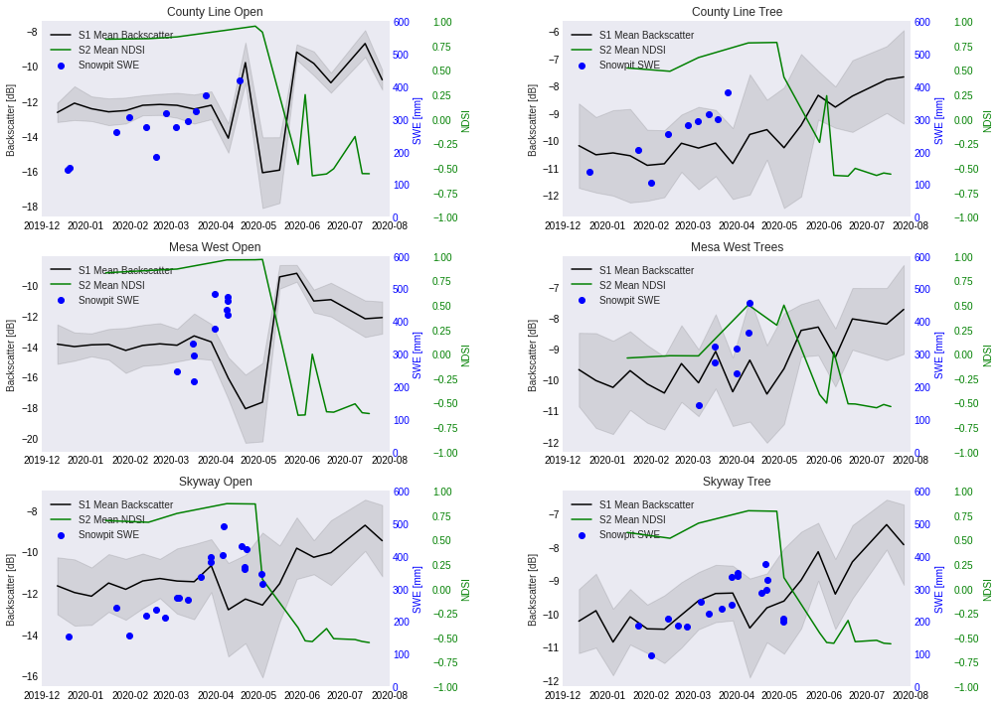

In [30]:
PitIDs = ['COGMCO','COGMCT','COGMWO','COGMWT','COGMSO','COGMST']

f,ax=plt.subplots(3,2,figsize=(14,10))

for pitid, axs in zip(PitIDs,ax.ravel()):
    snowpit = snowpits_buffer[snowpits_buffer['PitID']==pitid]
    ts_ds_clipped_site = ts_ds_dem_masked.rio.clip(snowpit.geometry)
    backscatter_line, = axs.plot(ts_ds_clipped_site.time,10*np.log10(ts_ds_clipped_site).mean(dim=['x','y']),color='black',label='S1 Mean Backscatter')
    ts_log = 10*np.log10(ts_ds_clipped_site)
    axs.fill_between(ts_ds_clipped_site.time,ts_log.mean(dim=['x','y'])-ts_log.std(dim=['x','y']),ts_log.mean(dim=['x','y'])+ts_log.std(dim=['x','y']),alpha=0.1,color='black')
    start_date = '2019-12-01'
    end_date = '2020-08-01'
    axs.set_xlim([datetime.strptime(start_date,'%Y-%m-%d'),datetime.strptime(end_date,'%Y-%m-%d')])
    axs.set_ylabel('Backscatter [dB]')
    #runoff_map_clipped.plot(ax=axs,cmap='twilight',vmin=0,vmax=365)
    axs.set_title(f'{snowpit.Site.values[0]}')

    ndsi_ax = axs.twinx()
    swe_ax = axs.twinx()
    ndsi_clipped_site = ndsi_dem_masked.rio.clip(snowpit.geometry)
    ndsi_clipped_site = ndsi_clipped_site.where(ndsi_clipped_site<1)
    ndsi_line, = ndsi_ax.plot(ndsi_clipped_site.time,ndsi_clipped_site.mean(dim=['x','y']),color='green',label='S2 Mean NDSI')
    
    swe_site = swe[swe['PitID'] == pitid]
    swe_scatter = swe_ax.scatter(x=swe_site['date'],y=swe_site['swe (mm)'],label='Snowpit SWE',c='blue')
    
    ndsi_ax.spines['right'].set_position(('outward', 40))

    ndsi_ax.set_ylim([-1,1])
    swe_ax.set_ylim([0,600])
    
    ndsi_ax.spines["right"].set_visible(True)
    ndsi_ax.yaxis.set_label_position('right') 
    ndsi_ax.yaxis.set_ticks_position('right')
    
    ndsi_ax.set_ylabel('NDSI')
    swe_ax.set_ylabel('SWE [mm]')
    
    swe_ax.yaxis.label.set_color('blue')
    ndsi_ax.yaxis.label.set_color(ndsi_line.get_color())
    
    axs.tick_params(colors='black', which='both')
    swe_ax.tick_params(colors='blue', which='both')
    ndsi_ax.tick_params(colors='green', which='both')
    
    axs.legend(handles=[backscatter_line,ndsi_line,swe_scatter],loc='upper left')
    

plt.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=None)


plt.savefig('../output/grandmesa/plots/bs_snowpits_ndsi_swe.png')

#### Everything seems to sync up nicely. We see minima in Sentinel-1 backscatter right as SWE seems to hit an inflection point. NDSI stays plateaued up until this point and drops significantly soon after. Something strange going on in the Mesa West Open data? Might want to check that out, maybe data processing error?